Before you turn this problem in, make sure everything runs as expected. First, **restart the kernel** (in the menubar, select Kernel$\rightarrow$Restart) and then **run all cells** (in the menubar, select Cell$\rightarrow$Run All).

Make sure you fill in any place that says `YOUR CODE HERE` or "YOUR ANSWER HERE", as well as your name and collaborators below:

In [1]:
NAME = "Tianhui Xu"
COLLABORATORS = ""
import matplotlib.pyplot as plt
import random
import time
%matplotlib inline
import seaborn as sns; sns.set()
import numpy as np

---


# CS110 Fall 2020 - Assignment 1
# Algorithm design & sorting - Problem set

Instead of a mini-project, which you will encounter in many of the upcoming CS110 assignments, this time you will be solving three independent problems. Use this opportunity to start your work early, finishing a question every week or so of class. Ideally, in the last week before the deadline, you will only have Q3 left to complete.

**Fell free to add more cells to the ones always provided in each question to expand your answers, as needed. Make sure to refer to the CS110 course guide on the grading guidelines, namely how many HC identifications and applications you are expected to include in each assignment.**

If you have any questions, do not hesitate to reach out to the TAs in the Slack channel "#cs110-algo-f20", or come to one of your instructors' OHs.

### Submission Materials
Your assignment submission needs to include the following resources:
1. A PDF file must be the first resource and it will be created from the Jupyter notebook template provided in these instructions. Please make sure to use the same function names as the ones provided in the template. If your name is “Dumbledore”, your PDF should be named “Dumbledore.pdf”.
2. Your second resource must be a single Python/Jupyter Notebook named “Dumbledore.ipynb”. You can also submit a zip file that includes your Jupyter notebook, but please make sure to name it “Dumbledore.zip” (if your name is Dumbledore!).

## Question 0 [#responsibility; appropriate CS110-LO]

Take a screenshot of your CS110 dashboard on Forum where the following is visible:
* your name.
* your absences for the course have been set to excused up to the end of week 3 (inclusively).

This will be evidence that you have submitted acceptable pre-class and make-up work
for a CS110 session you may have missed. Check the specific CS110 make-up and
pre-class policies in the syllabus of the course.



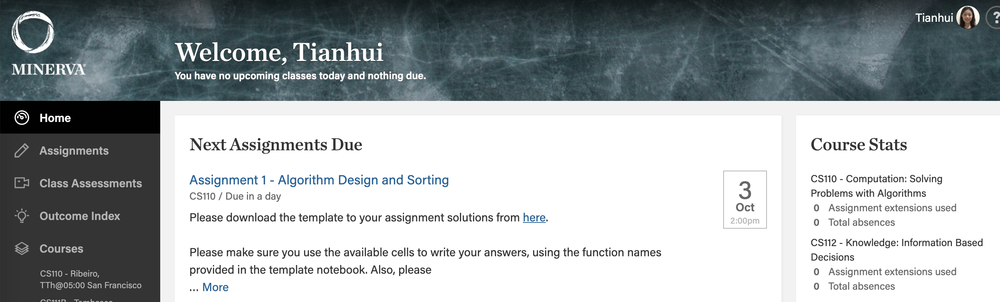

In [2]:
from IPython.display import Image
Image(filename="q0.png")

## Question 1: Iteration vs. recursion [#ComputationalSolutions, #PythonProgramming]

A [Fibonacci Sequence](https://en.wikipedia.org/wiki/Fibonacci_number) is a list of numbers, in which each number is the sum of the two previous ones (starting with 0 and 1). Mathematically, we can write it as:
- F(0) = 0
- F(1) = 1
- F(n) = F(n-1) + F(n-2) for n larger than 1.

Your task is to compute the **n**th number in the sequence, where **n** is an input to the function.

Use the code skeletons below to **provide two solutions** to the problem: an **iterative**, and a **recursive** one. For the recursive solution, feel free to use a helper function or add keyword arguments to the given function.

**Explain** how your solutions follow the iterative and recursive paradigms, respectively. **Discuss the pros and cons** of each approach as applied to this problem, and state which of your solutions you think is better, and why. Write approximately 100 words.


In [3]:
import time

def fibonacci_iterative(n):
    '''
    This function calculates the nth number in the Fibonacci Sequence with an iterative approach.
    
    Inputs and outputs
    --------
    Input:
    -n: an integer number larger than or equal to 0, indicating which number in the sequence to compute
    Output:
    -the nth number (index align with Python indexing) in the sequence
    
    Raises
    ------
    ValueError
        If `n` is not an integer larger than or equal to 0.
    '''
    
    if n == 0:   # list situations without the need of calculation
        return 0
    elif n == 1:
        return 1
    elif type(n) != int or n < 0:   # raise error with illegal inputs
        raise ValueError("Input must be an integer larger than or equal to 0")
    else:
        prev_1 = 1   # store the number before the current
        prev_2 = 0   # store the second number before current
        num_n = prev_2 + prev_1  # store the current number starting from the 3rd 
        for i in range(3,n+1):
            # this loop iterates over the remaining indexes till the nth is reached
            prev_2, prev_1 = prev_1, num_n
            num_n = prev_2 + prev_1   # calculate the ith number in the sequence
    return (num_n)

def fibonacci_recursive(n, i = 0, j = 1):
    '''
    This function calculates the nth number in the Fibonacci Sequence with an recursive approach.
    
    Inputs and outpus
    --------
    Input:
    -n: an integer number larger than or equal to 0, indicating which number in the sequence to compute
    -i: the current (n-2)th number
    -j: the current (n-1)th number
    Output:
    -the nth number (index align with Python indexing) in the sequence
    
    Raises
    ------
    ValueError
        If `n` is not an integer larger than or equal to 0.
    '''
    # two base cases when n equals 0 or 1
    if n == 0:
        return i
    elif n == 1:
        return j
    elif type(n) != int or n < 0:   # raise error with illegal inputs
        raise ValueError("Input must be an integer larger than or equal to 0")
    else:
        # recursive case that calls the function itself to get the sum
        # the recusion is tailed so that the function only calls at last
        # non-tail: return(fibonacci_recursive(n-1)+fibonacci_recursive(n-2)) 
        return fibonacci_recursive(n - 1, j, i + j)

In [4]:
assert fibonacci_iterative(0) == 0
assert fibonacci_recursive(0) == 0
assert fibonacci_iterative(4) == 3
assert fibonacci_recursive(4) == 3

Explain how your solutions follow the iterative and recursive paradigms, respectively. Discuss the pros and cons of each approach as applied to this problem, and state which of your solutions you think is better, and why. Write approximately 100 words.

The iterative solution follows the paradigm that it uses a for loop to calculate every element of the sequence with the same process until the nth one is reached. The pro is that it takes less memory space because it only needs to store three numbers. The con of this approach is that it’s complicated and redundant.<br>
The recursive solution follows the paradigm that it has a recursive case that calls itself repeatedly until a certain condition is met: a base case checking whether n equals 0 or 1. The pro is that the process is clearer and simpler and may benefit the testing and debugging process. The con is that the call stack can get very large and take up a lot of memory space because every function call needs to be stored. In terms of time, the two approaches are asymptotically the same.<br>
In this case, the recursive approach is better because the memory space problem is solved using tail recursion, by only operating the function call at the end, so it surpasses the iterative approach overall.

## Question 2: Understanding and documenting code [#CodeReadability, #SortingAlgorithms]
Imagine that you land your dream software engineering job, and among the first things you encounter is a previously written, poorly documented, and commented code.

Asking others how it works proved fruitless, as the original developer left. You are left with no choice but to understand the code’s inner mechanisms, and document it properly for both yourself and others. The previous developer also left behind several tests that show the code working correctly, but you have a hunch that there might be some problems there, too. Your tasks are listed below. Here is the code:

In [5]:
def my_sort(array):
    """
    YOUR DOCSTRING HERE
    """
    
    # ...
    for i in range(len(array)):
        
        # ...
        item = array[i]
        
        # ...
        intended_position = 0
        for num in array:
            if num < item:
                intended_position += 1
                
        # ...
        if i == intended_position:
            continue
        
        # ...
        array[intended_position], item = item, array[intended_position]
        
        # ...
        while i != intended_position:
            
            # ...
            intended_position = 0
            for num in array:
                if num < item:
                    intended_position += 1
            
            # ...
            array[intended_position], item = item, array[intended_position]
            
    return array
            


assert my_sort([8, 5, 7]) == [5, 7, 8]
assert my_sort([10, 9, 8, 7, 6, 5, 4, 3, 2, 1]) == [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
input_array = [43, 99, 85, 45, 21, 58, 24, 12, 14, 64, 19, 94, 56, 13, 51, 2, 37, 11, 8, 66, 3, 95, 93, 53, 35, 81, 97, 9, 47, 78, 27, 50, 82, 71, 62, 59, 57, 42, 69, 72, 30, 63, 18, 31, 32, 88, 92, 73, 10, 74, 41, 22, 1, 80, 5, 60, 76, 52, 49, 77, 54, 44, 15, 7, 28, 84, 33, 83, 16, 91, 67, 23, 87, 25, 79, 89, 34, 4, 38, 48, 6, 96, 39, 40, 68, 55, 20, 36, 29, 65, 86, 70, 26, 98, 46, 90, 17, 0, 61, 75]
assert my_sort(input_array) == sorted(input_array)

### Question 2a: Understanding code
**Explain**, in your own words, **what the code is doing** (it’s sorting an array, yes, but how?). Feel free to use diagrams, play around with the code in other cells, print test cases or partially sorted arrays, draw step by step images. In the end, you should produce an approximately 150-word write-up of how the code is processing the input array.

The code sorts an array by iterating over the loop, focusing on each position at a time, and do swapping until the correct element is in this focused position. The function returns a sorted list until all the positions are checked.
<br>

Next, I'll explain step by step.<br>

1. Given an example input array [4, 5, 8, 2, 6], we first go into the outer for loop in which i = 0, item = 4, indicating that for this loop, we are going to make sure the correct element is put at this position, which, in this case, is the smallest number. Another variable intended_position is also set to 0 to track the comparison and indicate the element that will be swapped at the end.
2. Entering the nested for loop, which compares the current item with all the numbers in the array to see how many numbers are smaller than it, so that we could know where the item should be in a sorted array. In this case, as only 2 is smaller than 4, so the intended position of 4 is 1 which is the second place in the array. Therefore, it's swapped with 5, which is currently on index 1, to be in the correct position.  
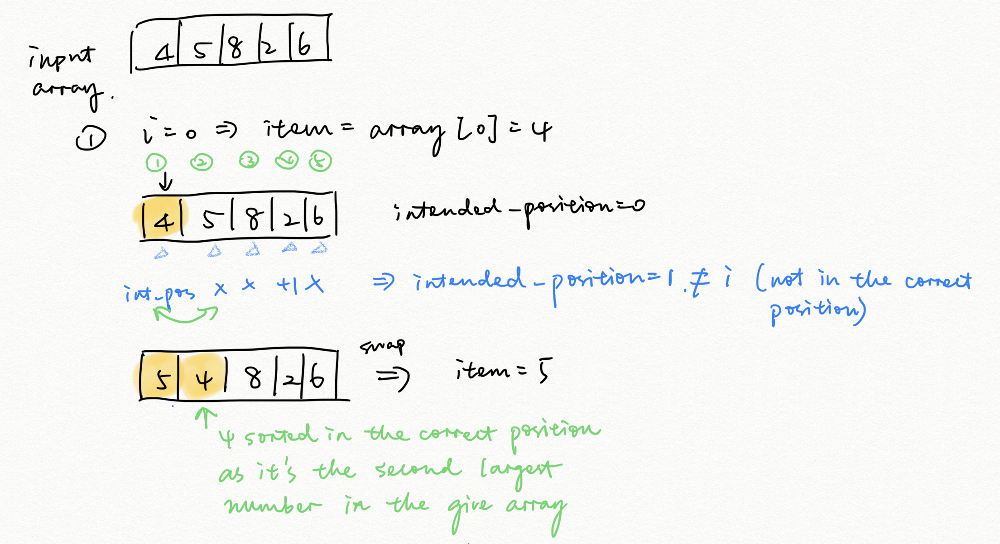
3. The if statement after the for loop checks that whether the targeted item is already at its correct position. If so, it will skip the rest of the for loop and continue with the next one.
4. Entering the nested while loop, which uses the same logic - doing swaps continuously until the correct element is put in index[i], which is the first position in this loop. In this example, 5 at index 1 is swapped with 8 to be in its correct position - third largest, and the target item now becomes 8.
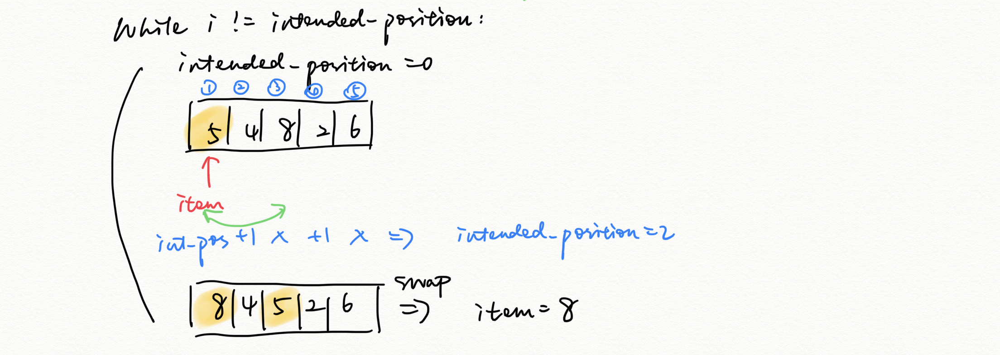
5. The while loop continues this procedure, swapping 8 with 6, 6 with 2, and get i = intended position, which means that we have the correct element at index 0.
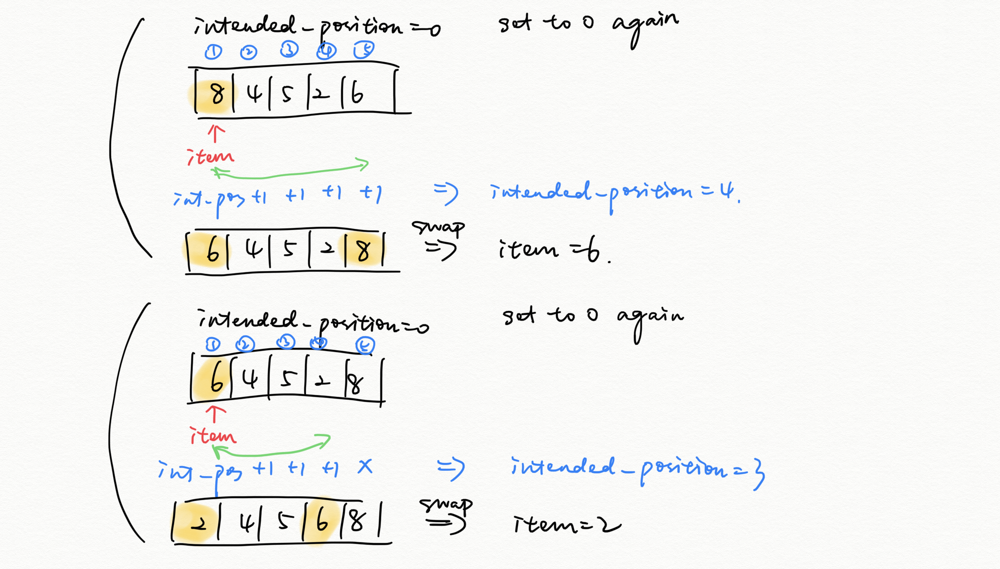
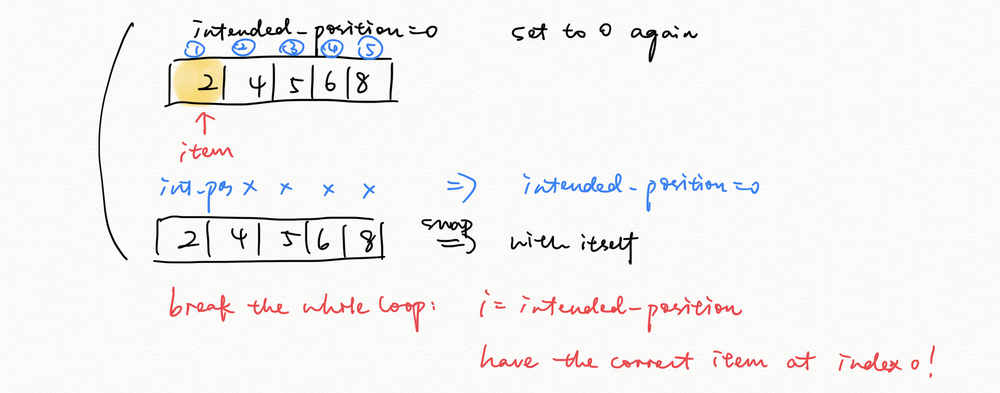
6. Enter the next iteration of for loop, which do the same thing to the second position in the array. This time, since 4 is already the correct number to be in the position, the loop will automatically continue to the next. And it works the same when i = 2, 3, 4 in this example.
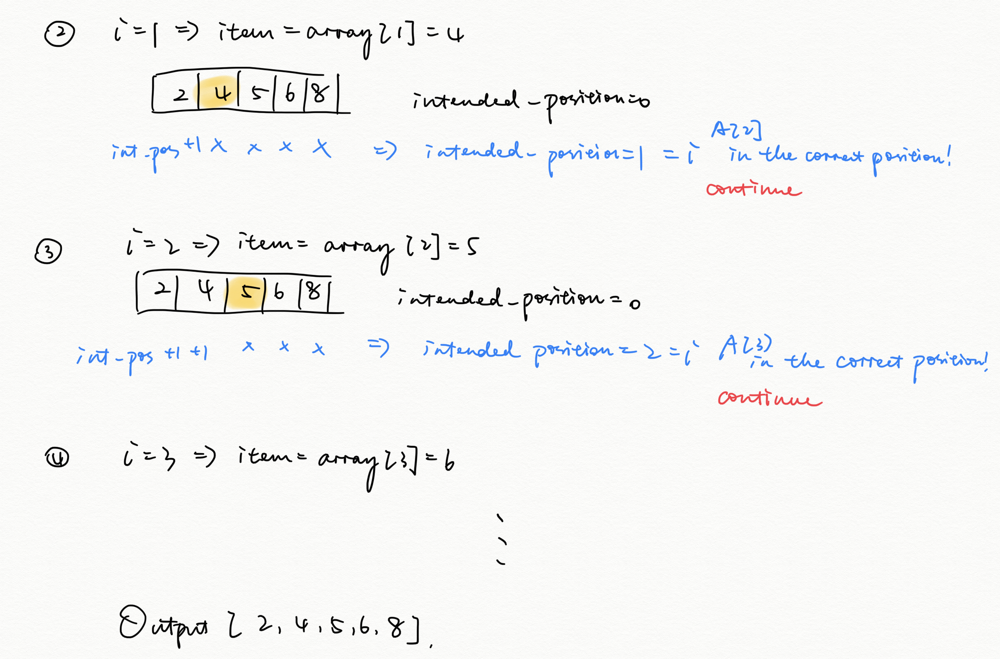
7. At last, it would get to the return statement of the sorted list, [2, 4, 5, 6, 8] in this case.

### Question 2b: Documenting code
**Explain** the difference between docstrings and comments. **Add** both a proper **docstring** and several **in-line comments** to the code (there is an editable copy below). You can follow the empty comments to guide you, but you can deviate, within reason. If this topic seems new to you, [here](https://realpython.com/documenting-python-code/), [here](https://www.datacamp.com/community/tutorials/docstrings-python) and [here](https://sphinxcontrib-napoleon.readthedocs.io/en/latest/example_numpy.html) are some resources to get you started. Anyone from your section should be able to understand the code from your documentation. Remember, however, that brevity is also a desirable feature.

Docstrings help to document the functionality of the larger part of the code, for example an entire function, class, object, etc. Comments, on the other hand, are used for smaller segments of code, like several lines of code for an expression, a loop, etc.<br>

In terms of content, doctrings is more systematical and structural in explaining the use, with a more general target audience who wish to make use of the object. However, comments help to guide other developers or the programmer hime/herself through the code to understand what the code is doing. Sometimes comments also help the programmer add track todos, etc.

In [6]:
def my_sort(array):
    """
    This function sorts an array.
    ------------
    Input:
    - array: a list of numbers 
    
    Output: 
    - array: the sorted list of numbers
    """
    
    # the for loop iterates over every number of the list
    for i in range(len(array)):
        # set item to the current number of the list to be sorted
        item = array[i]
        
        intended_position = 0    # keep track of the comparison
        for num in array:
            # get the number of items lower than the current number
            # so that we could sort it to the correct place
            if num < item:
                intended_position += 1
                
        # continue with the next loop when the targeted number is already at its intended position
        if i == intended_position:
            continue
        
        # swap the item with the item at the intended position
        array[intended_position], item = item, array[intended_position]
        
        # sort for the number that's being swapped, till the correct number is at index i
        while i != intended_position:
            
            # set intended position to 0 again to find the position for "item"
            intended_position = 0
            # compare every element with item to find the correct position for it
            for num in array:
                if num < item:
                    intended_position += 1
            
            # swap to place the item into the right place
            array[intended_position], item = item, array[intended_position]
            
    return array

### Question 2c: Testing code
**Why** are the tests that you are presented with insufficient? **Provide at least one** reasonable test case that you would include that the code doesn’t pass (but you think it should).

You can also fix the code to pass your new tests, but this is an optional challenge.

The tests are insufficient because they only covered a reversed list, a partially sorted list and a comparatively long list. However, the test didn't take into account the edge cases, for example list with a single element, list with negative elements, sorted list, and also list with duplicated values. <br>

The code didn't pass the case when there are duplicated values, for example, my_sort([1,2,3,4,5,6,6,7]), because for such a case variable 'i' will always be equal to variable 'intended position' after the first nested for loop, so that the outer for loop will automatically continue to the next and the return statement will never be executed. 

## Question 3: New and mixed sorting approaches [#SortingAlgorithms, #ComputationalCritique, #PythonProgramming, #ComplexityAnalysis]
In this question, you will implement and critique a previously unseen sorting algorithm. You will then combine it with another, known sorting algorithm, to see whether you can reach better behavior. This is the most difficult of the assignment questions, so schedule enough time for it.

### Question 3a: Implementation from pseudocode
Use the following pseudocode to **implement merge_3_sort()**. It is similar to merge sort — only that instead of splitting the initial array into halves, you will now split it into thirds, call the function recursively on each sublist, and then merge the triplets together. You might want to refer to this [beautiful resource](https://drive.google.com/file/d/1XH5bNiHhVchVWoCDLBtvjsCFkL9cU0do/view?pli=1) written by Prof. Drummond for details about the regular merge sort algorithm.

Code in the second cell; the first cell is locked so that you always have access to the original pseudocode.

In [7]:
def merge_3_sort(array, p, q):
    """
    Sorts array[p] to array[q] in place.


    Parameters
    ----------
    array : Python list or numpy array
    p : int
        index of array element to start sorting from
    q : int
        index of last array element to be sorted

    Returns
    -------
    array: a sorted Python list

    """
    # check if more than one elements remain between array[p] and array[q]
        # otherwise return the single element remaining
        
    # calculate where one-third and two-thirds of the input array are
    # recursively call merge_3_sort() on each of the three sublists
    
    # call merge_3() on the three sorted sublists to combine them
        # this can be either done as a return or in-place
    
    # return the sorted array
    
def merge_3(array, p, q, r, s):
    """
    Merges 3 sorted sublists (array[p] to array[q], array[q+1] to array[r] and array[r+1] to array[s]) in place.
    
    Parameters
    ----------
    array : Python list or numpy array
    p : int
        index of first element of first sublist
    q : int
        index of last element of first sublist
    r : int
        index of last element of second sublist
    s : int
        index of last element of third sublist

    """
    
    # copy each sublist to a placeholder
    # append infinity to the end of each placeholder list
    
    # fill each position in array[p] to array[q]
        # use the smallest of the front elements of the placeholder lists

In [8]:
# YOUR CODE IN THIS CELL
def merge_3(array, p, q, r, s):
    """
    Merges 3 sorted sublists (array[p] to array[q], array[q+1] to array[r] and array[r+1] to array[s]) in place.
    
    Parameters
    ----------
    array : Python list or numpy array
    p : int
        index of first element of first sublist
    q : int
        index of last element of first sublist
    r : int
        index of last element of second sublist
    s : int
        index of last element of third sublist

    """
    # calculate the length for three sublists a, b, and c
    
    n1 = q - p + 1
    n2 = r - q
    n3 = s - r 
    
    # copy each sublist to a placeholder
    a = array[0:n1]
    b = array[n1:(n1+n2)]
    c = array[(n1+n2):len(array)]
    # append infinity to the end of each placeholder list
    a.append(float('inf'))   
    b.append(float('inf'))
    c.append(float('inf'))
    
    # create three indices i, j and k to keep track of the comparing process
    i = 0
    j = 0
    k = 0
    for x in range(0,len(array)):
        # the for loop iterative over each position in array[p] to array[q]
        # and copies the smallest of the front elements of the placeholder lists
        if a[i] <= b[j] and a[i] <= c[k]:
            array[x] = a[i]
            i += 1
        elif b[j] <= a[i] and b[j] <= c[k]:
            array[x] = b[j]
            j += 1
        else:
            array[x] = c[k]
            k += 1
    return array

In [9]:
def merge_3_sort(array, p, q):
    """
    Sorts array[p] to array[q] (inclusive) in place.


    Parameters
    ----------
    array : Python list or numpy array
    p : int
        index of array element to start sorting from
    q : int
        index of last array element to be sorted plus one

    Returns
    -------
    array: a sorted Python list

    """
    # base case: check if more than one elements remain between array[p] and array[q]
    if (q - p) == 0:
        # otherwise return the single element remaining
        return []
    elif (q - p) == 1:
        return [array[p]]
    else:
        # calculate where one-third and two-thirds of the input array are
        one_third_idx = p + (q+1-p)//3
        two_third_idx = p + (q+1-p)//3 * 2
        
        # call merge_3_sort() on the three sublists
        array = merge_3_sort(array,p,one_third_idx) + 
        merge_3_sort(array,one_third_idx,two_third_idx) + 
        merge_3_sort(array,two_third_idx,q)

        # call merge_3() on the three sorted sublists to combine them
        array = merge_3(array,p,one_third_idx-1,two_third_idx-1,q)
    
        # return the sorted array
        return array

### Question 3b: Testing your code
To the singular test provided below, **add** at least **5 more assert statements**, which showcase that your code works as intended. In a few sentences, **justify** why your set of tests is appropriate and possibly sufficient.

In [10]:
input_array = [8, 5, 4, 6, 7, 2, 9, 1, 3]
assert merge_3_sort(input_array, 0, 9) == sorted(input_array)
input_array = [1, 2, 3, 4]
assert merge_3_sort(input_array,0, 4) == sorted(input_array)
input_array = [8, 7, 6, 5, 4]
assert merge_3_sort(input_array,0, 5) == sorted(input_array)
input_array = [4]
assert merge_3_sort(input_array,0, 1) == sorted(input_array)
input_array = [3.5,4.6,8.2,8.2]
assert merge_3_sort(input_array,0, 4) == sorted(input_array)
input_array = [-1000,250,350,210,210]
assert merge_3_sort(input_array,0, 5) == sorted(input_array)

In [11]:
# Please ignore this cell.
# It is for us to implement tests to check your code.

The tests included all the edge cases that the code could potentially not accounting for, assuming all the inputs are legal. Extreme values like a single-element array, different kind of lists like sorted list/reversed list/partically sorted list/list with negative numbers/list with duplicated values are used to test for potential flaws of a sorting algorithm.

If it's possible, we should also include a test case with a very large number of elements to test how this function performs with large inputs to see the efficiency and performance.

### Question 3c: Mixing algorithms
The algorithm becomes unnecessarily complicated when it tries to sort a really short piece of the original array, continuing the splits into single-element arrays. To work around this, **implement the following**: if the input sublist length is below a certain threshold (which you decide), sort it by bubble sort instead of continuing to recurse. To ensure you won’t break your old code, first copy it to the cell below, and then create the new version here.

**Justify** on the basis of analytical or even experimental arguments what might be the optimal threshold for switching to bubble sort.

Remember that **tests** are important.

In [12]:
def bubble_sort(array):
    '''
    this function takes an input of an array and outputs a nondecreasing sequence of that array, 
    using a bubble sort algorithm
    '''
    n = len(array)
    # make sure the number of iterations is equal to the number of items in the array
    for i in range(0, n-1):  
        for j in range(n-1, i, -1):   # set a limit value of j
            if array[j] < array[j-1]:
                # swapping the adjacement numbers if they are not in the correct order
                array[j-1],array[j] = array[j],array[j-1]
    return array

def merge_3_sort_threshold(array, p, q):
    """
    Sorts array[p] to array[q] (inclusive) in place mainly with merge sort 
    but also uses bubble sorts for smaller arrays.

    Parameters
    ----------
    array : Python list or numpy array
    p : int
        index of array element to start sorting from
    q : int
        index of last array element to be sorted plus one

    Returns
    -------
    array: a sorted Python list

    """
    if (q - p) == 0:
        return []
    elif (q - p) == 1:
        return [array[p]]
    else:
        # if the number of elements in an array is below a certain threshold, 
        # it will implement bubble sort instead
        if (q - p) < 20: 
            return bubble_sort(array[p:q])
        else:
            # otherwise apply merge sort and continue splitting
            one_third_idx = p + (q+1-p)//3
            two_third_idx = p + (q+1-p)//3 * 2
        
            array = merge_3_sort_threshold(array,p,one_third_idx) + 
            merge_3_sort_threshold(array,one_third_idx,two_third_idx) + 
            merge_3_sort_threshold(array,two_third_idx,q)

            array = merge_3(array,p,one_third_idx-1,two_third_idx-1,q)
    
            return array
    
def merge_3(array, p, q, r, s):
    """
    Merges 3 sorted sublists (array[p] to array[q], array[q+1] to array[r] and array[r+1] to array[s]) in place.
    
    Parameters
    ----------
    array : Python list or numpy array
    p : int
        index of first element of first sublist
    q : int
        index of last element of first sublist
    r : int
        index of last element of second sublist
    s : int
        index of last element of third sublist

    """
    
    n1 = q - p + 1
    n2 = r - q
    n3 = s - r 
    

    a = array[0:n1]
    b = array[n1:(n1+n2)]
    c = array[(n1+n2):len(array)]

    a.append(float('inf'))   
    b.append(float('inf'))
    c.append(float('inf'))
    
    # create three indices i, j and k to keep track of the comparing process
    i = 0
    j = 0
    k = 0
    for x in range(0,len(array)):
        # the for loop iterative over each position in array[p] to array[q]
        # and copies the smallest of the front elements of the placeholder lists
        if a[i] <= b[j] and a[i] <= c[k]:
            array[x] = a[i]
            i += 1
        elif b[j] <= a[i] and b[j] <= c[k]:
            array[x] = b[j]
            j += 1
        else:
            array[x] = c[k]
            k += 1
    return array
    
input_array = [8, 5, 4, 6, 7, 2, 9, 1, 3, 4, 5, 2, 5, 7, 4, 6, 3, 4, 5, 7, 9, 5, 6, 4]
assert merge_3_sort_threshold(input_array, 0, 26) == sorted(input_array)
input_array = [1, 2, 3, 4]
assert merge_3_sort_threshold(input_array,0, 4) == sorted(input_array)
input_array = [8, 7, 6, 5, 4]
assert merge_3_sort_threshold(input_array,0, 5) == sorted(input_array)
input_array = [4]
assert merge_3_sort_threshold(input_array,0, 1) == sorted(input_array)
input_array = [3.5,4.6,8.2,8.2,3.5,4.6,8.2,8.2,3.5,4.6,8.2,8.2,3.5,4.6,8.2,8.2,3.5,4.6,8.2,8.2]
assert merge_3_sort_threshold(input_array,0, 24) == sorted(input_array)
input_array = [-1000,250,350,210,210,-1000,-2000,-20,-20,3,4,5,6,2,6,4,6,3,5,7]
assert merge_3_sort_threshold(input_array,0, 21) == sorted(input_array)

In [13]:
# Please ignore this cell.
# It is for us to implement tests to check your code.

Then, I will justify why I chose a threshold of 20.

In [14]:
def generate_inputs(type_input, N, interval):
    '''
    This function is adapted from the code in activity for session 5.
    
    This function generates data of size 1..N in the format of the inputted 'type_input' variable.
    --------
    Inputs:
    -type_input: options are 'Sorted', 'Reversed' or 'Random' that indicate the format of the data generated
    -N: maximum size of input list
    -interval: interval of sizes for the elements on the list
    Outputs:
    -A list of lists to be sorted
    '''
    data = []
    for i in range(0, N+1, interval):
        if type_input == 'Reversed':
            data.append([j for j in range(i+1,1,-1)])
        elif type_input == 'Random': 
            data.append([random.randint(1,1000) for j in range(i)])
        elif type_input == 'Sorted':
            data.append([j for j in range(1,i+1)])
        else:
            raise ValueError('This is an unsupported type_input; please try again.')
    return data

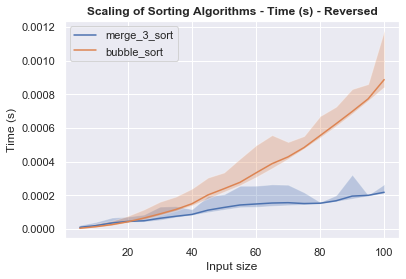

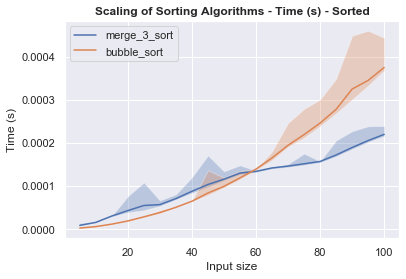

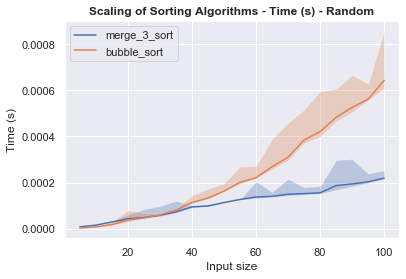

In [15]:
'''
this cell of code compares the running time of three-way merge sort and bubble sort to determine the threshold
''' 

# generate input data with a maximum size of 100 and do it for 200 times 
N = 100
n_runs = 500

input_data_random = generate_inputs('Random',N=N,interval=N//20)
input_data_reversed = generate_inputs('Reversed',N=N,interval=N//20)
input_data_sorted = generate_inputs('Sorted',N=N,interval=N//20)


def compare_merge_3_bubble(input_data,input_type):
    '''
    The code in this function is adapted from activity in Session 5.
    ----------
    This function compares the performance between three-way merge sort and bubble sort 
    in terms of running time.
    It produces a line plot to showcase their running time.
    ----------
    Input:
    - input_data: generated list of list of arrays to be sorted
    - input_type: a string indicating the type of input data
    Output:
    - None
    '''
    sorting_data = {}
    for ele in input_data[1:]:
        # iterative over the generated list of input data to document for the running time of both algorithms
        # results are stored in a dictionary with algorithm names and input size as keys
        if 'merge_3_sort' not in sorting_data.keys():
            sorting_data['merge_3_sort'] = {}
            sorting_data['merge_3_sort'][len(ele)] = {}
        temp_list = []
        for experiments in range(n_runs):
            start = time.time()
            el1 = ele.copy()
            merge_3_sort(el1,0,len(el1))
            temp_list.append(time.time() - start)
        sorting_data['merge_3_sort'][len(ele)] = temp_list
        if 'bubble_sort' not in sorting_data.keys():
            sorting_data['bubble_sort'] = {}
            sorting_data['bubble_sort'][len(ele)] = {}
        temp_list = []
        for experiments in range(n_runs):
            start = time.time()
            el1 = ele.copy()
            bubble_sort(el1)
            temp_list.append(time.time() - start)
        sorting_data['bubble_sort'][len(ele)] = temp_list
        
    for algo in sorting_data.keys():
        x_data = sorted(list(sorting_data[algo]))
        y_data = [np.mean(sorting_data[algo][x]) for x in x_data]
        y_lower = [np.quantile(sorting_data[algo][x], (1/2)*(1-95/100)) for x in x_data]
        y_upper = [np.quantile(sorting_data[algo][x], (1/2)*(1+95/100)) for x in x_data]
        ax = sns.lineplot(x_data, y_data, label=algo) 
        ax.fill_between(x_data, y_lower, y_upper, alpha=0.3)
        plt.xlabel('Input size')
        plt.ylabel('Time (s)')
        plt.legend(loc='upper left')
        plt.title('Scaling of Sorting Algorithms - Time (s) - ' + input_type, fontweight='bold')
    plt.show()
    return None

# call the compare function to all three kinds of datasets
compare_merge_3_bubble(input_data_reversed,'Reversed')
compare_merge_3_bubble(input_data_sorted,'Sorted')
compare_merge_3_bubble(input_data_random,'Random')

I would choose a threshold of **20**. 
- From this experimental approach, we could see the point where merge sort exceeds bubble sort in terms of running time. For reversed input lists, the threshold is around 20; for sorted input lists, the threshold is around 60, and for random input lists, the threshold is around 25. In this case, I would choose a threshold of 20 for the mixed algorithm, because the graph shows that after each threshold, the running time of bubble sort will increase very quickly, so I would rather choose to accomodate for a lower threshold than a higher one to avoid high running time between input size of 20 and 40 for not sored cases.
- From the analytical approach, we could equate the steps needed for both approach,with i as a variable, and solve for the solution.

### Question 3d: Algorithmic comparison
Finally, **assess** taking the mixed approach versus a strictly recursive algorithm. Make this comparison as complete as possible. This should include both an analytical BigO complexity definition, as well as graphical experimental evidence. Finally, you need to include a write-up summarizing the discovered information, comparing and contrasting the two algorithms in terms of any metrics you deem important (up to 200 words).

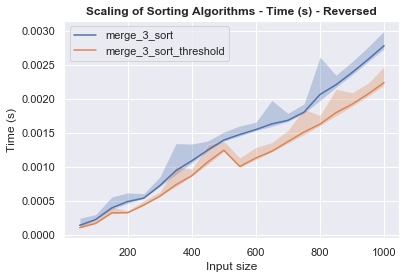

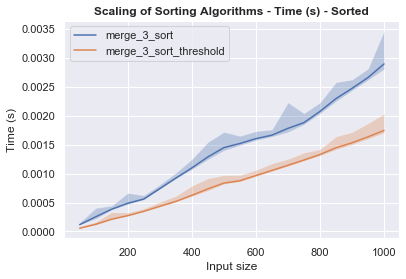

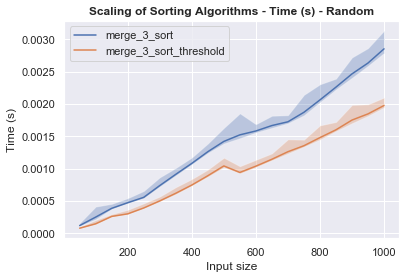

In [16]:
# compare the running time of three-way merge sort and bubble sort to determine the threshold

# generate input data with a maximum size of 100 and do it for 200 times 
N = 1000
n_runs = 200

input_data_random = generate_inputs('Random',N=N,interval=N//20)
input_data_reversed = generate_inputs('Reversed',N=N,interval=N//20)
input_data_sorted = generate_inputs('Sorted',N=N,interval=N//20)


def compare_merge_3_threshold(input_data,input_type):
    '''
    The code in this function is adapted from activity in Session 5.
    ----------
    This function compares the performance between the recursive three-way merge sort and 
    the one optimized on small arrays with bubble sort in terms of running time.
    It produces a line plot to showcase their running time respectively.
    ----------
    Input:
    - input_data: generated list of list of arrays to be sorted
    Output:
    - None
    '''
    sorting_data = {}
    for ele in input_data[1:]:
        # iterative over the generated list of input data to document for the running time of both algorithms
        # results are stored in a dictionary with algorithm names and input size as keys
        if 'merge_3_sort' not in sorting_data.keys():
            sorting_data['merge_3_sort'] = {}
            sorting_data['merge_3_sort'][len(ele)] = {}
        temp_list = []
        for experiments in range(n_runs):
            start = time.time()
            el1 = ele.copy()
            merge_3_sort(el1,0,len(el1))
            temp_list.append(time.time() - start)
        sorting_data['merge_3_sort'][len(ele)] = temp_list
        if 'merge_3_sort_threshold' not in sorting_data.keys():
            sorting_data['merge_3_sort_threshold'] = {}
            sorting_data['merge_3_sort_threshold'][len(ele)] = {}
        temp_list = []
        for experiments in range(n_runs):
            start = time.time()
            el1 = ele.copy()
            merge_3_sort_threshold(el1,0,len(el1))
            temp_list.append(time.time() - start)
        sorting_data['merge_3_sort_threshold'][len(ele)] = temp_list
        
    for algo in sorting_data.keys():
        x_data = sorted(list(sorting_data[algo]))
        y_data = [np.mean(sorting_data[algo][x]) for x in x_data]
        y_lower = [np.quantile(sorting_data[algo][x], (1/2)*(1-95/100)) for x in x_data]
        y_upper = [np.quantile(sorting_data[algo][x], (1/2)*(1+95/100)) for x in x_data]
        ax = sns.lineplot(x_data, y_data, label=algo) 
        ax.fill_between(x_data, y_lower, y_upper, alpha=0.3)
        plt.xlabel('Input size')
        plt.ylabel('Time (s)')
        plt.legend(loc='upper left')
        plt.title(str('Scaling of Sorting Algorithms - Time (s) - ' 
                      + input_type), fontweight='bold')
    plt.show()
    return None

# call the compare function to all three kinds of datasets
compare_merge_3_threshold(input_data_reversed,'Reversed')
compare_merge_3_threshold(input_data_sorted,'Sorted')
compare_merge_3_threshold(input_data_random,'Random')

1. Experimental:
    The above graphs show the experimental comparison, against three types of inputs. They show that the running time of the mixed approach is constantly smaller than that of a strictly recursive approach. And the gap tends to widen as input size increases. 
<br>
2. Analytical:
    - Steps and running time: For the mixed approach, there are two kinds of steps, the steps for dividing and merging, and the steps for bubble sorting. For bubble sorting, the maximum number of steps needed is $(n(n-1))/2$. Suppose that there are i (threshold) elements in each list and there are a total of $n/i$ lists, then the steps for bubble sorting for the list are $i(i-1)*n/i$ = $ni-n$. For dividing and merging, since the merge sort is three-way, the total number of the recursive divide would be $log_3(n/i)$ and each merge would need $O(n)$ time because it needs to iterate over the list for comparison. Therefore, combined together, the time needed is $n*log_3(n/i) + ni-n$. Using the asymptotic notation, it will be $O(nlog_3(n/i))$. For the original approach, the time needed is $T(n) = 3T(n/3) + O(n)$ and the big O notation is $O(nlog_3(n))$. 
    - Space complexity: $\Theta(n)$ for the strict recursive approach because we'll need to store the array to be merged for every element. For the mixed approach, the space needed is smaller, because, for the sublists which are sorted using bubble sort, it's in place and doesn't need to be stored elsewhere.
    
<br>From the above analysis, we could see that the mixed approach is more efficient.